# SEDS Avionics Task 1

## Finding the Sea Floor

This notebook contains my work on the depth-data processing part of the SEDS BPHC avionics induction task.

In [4]:
pip install matplotlib

   ---------------------------------------- 0.0/9.5 MB ? eta -:--:--
   --- ------------------------------------ 0.8/9.5 MB 4.5 MB/s eta 0:00:02
   ------- -------------------------------- 1.8/9.5 MB 4.6 MB/s eta 0:00:02
   ------------ --------------------------- 2.9/9.5 MB 5.1 MB/s eta 0:00:02
   ------------------- -------------------- 4.7/9.5 MB 5.7 MB/s eta 0:00:01
   -------------------------- ------------- 6.3/9.5 MB 6.0 MB/s eta 0:00:01
   --------------------------------- ------ 7.9/9.5 MB 6.2 MB/s eta 0:00:01
   -------------------------------------- - 9.2/9.5 MB 6.3 MB/s eta 0:00:01
   ---------------------------------------- 9.5/9.5 MB 6.2 MB/s  0:00:01
   ---------------------------------------- 0.0/2.3 MB ? eta -:--:--
   ---------------------- ----------------- 1.3/2.3 MB 6.4 MB/s eta 0:00:01
   ---------------------------------------- 2.3/2.3 MB 6.2 MB/s  0:00:00
   ---------------------------------------- 0.0/7.2 MB ? eta -:--:--
   ------- ----------------------------

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

## These are the main modules I used for the data processing and visualization.


In [6]:
print(dir(pd))

## This is just me checking the available pandas functions in case I need them later.

print(dir(plt))

## Same here for matplotlib.pyplot.


['ArrowDtype', 'BooleanDtype', 'Categorical', 'CategoricalDtype', 'CategoricalIndex', 'DataFrame', 'DateOffset', 'DatetimeIndex', 'DatetimeTZDtype', 'ExcelFile', 'ExcelWriter', 'Flags', 'Float32Dtype', 'Float64Dtype', 'Grouper', 'HDFStore', 'Index', 'IndexSlice', 'Int16Dtype', 'Int32Dtype', 'Int64Dtype', 'Int8Dtype', 'Interval', 'IntervalDtype', 'IntervalIndex', 'MultiIndex', 'NA', 'NaT', 'NamedAgg', 'Period', 'PeriodDtype', 'PeriodIndex', 'RangeIndex', 'Series', 'SparseDtype', 'StringDtype', 'Timedelta', 'TimedeltaIndex', 'Timestamp', 'UInt16Dtype', 'UInt32Dtype', 'UInt64Dtype', 'UInt8Dtype', '__all__', '__builtins__', '__cached__', '__doc__', '__docformat__', '__file__', '__git_version__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '__version__', '_built_with_meson', '_config', '_is_numpy_dev', '_libs', '_pandas_datetime_CAPI', '_pandas_parser_CAPI', '_testing', '_typing', '_version_meson', 'annotations', 'api', 'array', 'arrays', 'bdate_range', 'col', 'compat',

<Axes: xlabel='Point'>

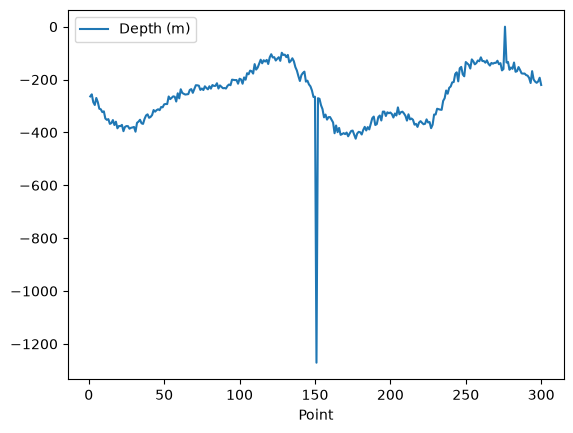

In [7]:
df = pd.read_csv('Depth Data.csv')

df.plot(x='Point', y='Depth (m)')

## This shows the graph of the original data given in the .csv file.
## The obvious outliers can be noticed from the graph.


In [8]:
df.describe()

## I mainly used this to get a quick statistical overview of the data
## and check the minimum, maximum and general spread of the depth values.

## From the data and the graph, there are two obvious outliers at Points 151 and 276.

## I think there are two ways to handle them:
## 1) Remove the two entries -> this would break the continuity of the data.
## 2) Replace the outliers using nearby values while keeping the data continuous.

# I think I'm gonna choose option 2.


,Point,Depth (m)
count,300.000000,300.000000
mean,150.500000,-262.547333
std,86.746758,110.464058
min,1.000000,-1271.100000
25%,75.750000,-347.400000
50%,150.500000,-254.450000
75%,225.250000,-176.300000
max,300.000000,0.000000


In [9]:
df2 = pd.read_csv('Depth Data.csv')

## I am creating a separate dataframe so the original data stays unchanged.

## Averaging and replacing the value of Point 151

add = 0

for i in range(5):
    if i == 2:
        continue
    add += df2.loc[df2['Point'] == (149 + i), 'Depth (m)'].iloc[0]

avg = add / 4

df2.loc[df2['Point'] == 151, 'Depth (m)'] = avg

df2.loc[df2['Point'] == 151, 'Depth (m)'].iloc[0]


np.float64(-268.45)

In [10]:
## Averaging and replacing the value of Point 276

add2 = 0

for j in range(5):
    if j == 2:
        continue
    add2 += df2.loc[df2['Point'] == (274 + j), 'Depth (m)'].iloc[0]

avg2 = add2 / 4

df2.loc[df2['Point'] == 276, 'Depth (m)'] = avg2

df2.loc[df2['Point'] == 276, 'Depth (m)'].iloc[0]


np.float64(-148.575)

<Axes: xlabel='Point'>

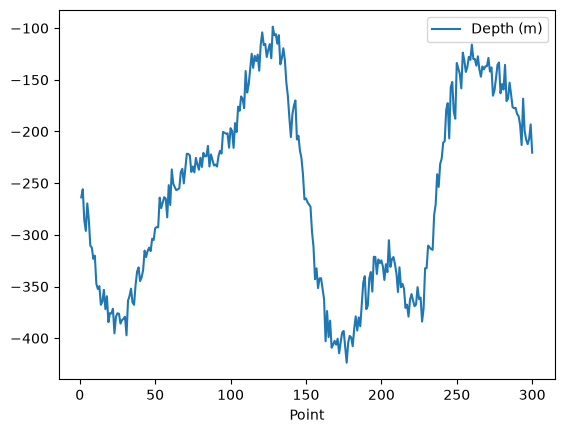

In [11]:
df2.plot(x='Point', y='Depth (m)')

## The obvious outliers have now been corrected.
## The data still has natural fluctuations, but the extreme values are gone.


In [12]:
df2['Noise Reduced Depth'] = (
    df2['Depth (m)']
    .rolling(window=5, center=True, min_periods=1)
    .median()
)

## For noise reduction, I used the median of every 5-point window.
## This helps reduce sudden spikes while keeping the overall shape of the data.


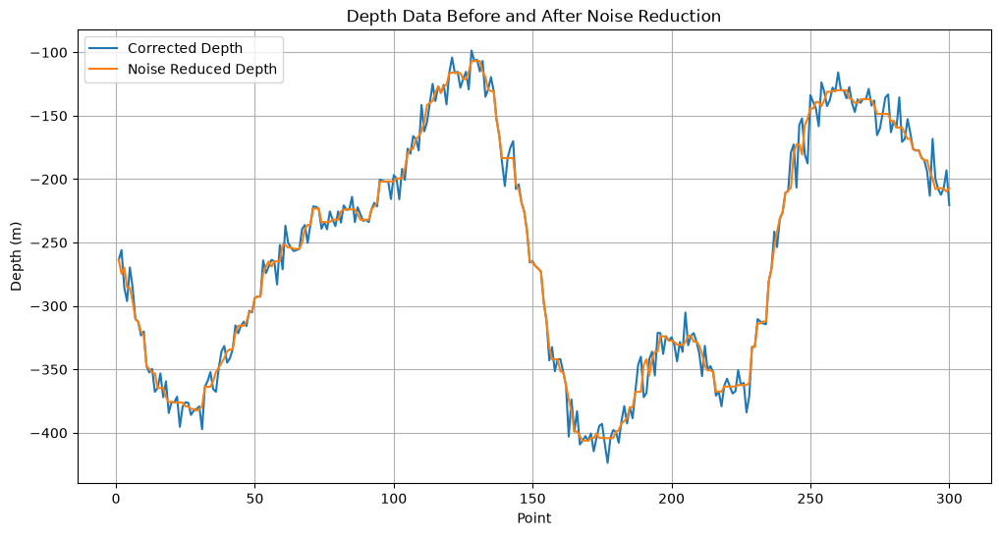

In [13]:
plt.figure(figsize=(12, 6))

plt.plot(df2['Point'], df2['Depth (m)'], label='Corrected Depth')
plt.plot(df2['Point'], df2['Noise Reduced Depth'], label='Noise Reduced Depth')

plt.xlabel('Point')
plt.ylabel('Depth (m)')
plt.title('Depth Data Before and After Noise Reduction')
plt.legend()
plt.grid()
plt.show()

## This plot compares the corrected data with the noise-reduced data.


In [14]:
x = df2['Point'].values
y = df2['Noise Reduced Depth'].values

fig, ax = plt.subplots(figsize=(12, 6))

ax.set_xlim(x.min(), x.max())
ax.set_ylim(-450, -50)

ax.set_xlabel('Point')
ax.set_ylabel('Depth (m)')
ax.set_title('Real-Time Depth Profiling')
ax.grid(alpha=0.3)

line, = ax.plot([], [], linewidth=2)
point, = ax.plot([], [], 'o', markersize=7)

info = ax.text(
    0.02, 0.95, '',
    transform=ax.transAxes,
    verticalalignment='top',
    fontsize=11
)

def update(frame):
    line.set_data(x[:frame + 1], y[:frame + 1])
    point.set_data([x[frame]], [y[frame]])

    info.set_text(
        f'Point: {x[frame]}\n'
        f'Depth: {y[frame]:.2f} m'
    )

    return line, point, info

animation = FuncAnimation(
    fig,
    update,
    frames=len(x),
    interval=40,
    blit=True
)

plt.close(fig)

HTML(animation.to_jshtml())

## The noise-reduced depth values are animated point-by-point to simulate
## the depth profile being built as measurements are collected.

## The animation code was developed with the help of ChatGPT.
## The data processing and analysis were done by me.
## Got to learn something new 😁
